<a href="https://colab.research.google.com/github/isosxwen/DL_Project/blob/master/train_25_face_detection_with_detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Face Detection on Custom Dataset with Detectron2

Face detection is the task of finding (boundaries of) faces in images. This is useful for 
- security systems (the first step in recognizing a person)
- autofocus and smile detection for making great photos
- detecting age, race, and emotional state for markering (yep, we already live in that world)

Historically, this was a really tough problem to solve. Tons of manual feature engineering, novel algorithms and methods were developed to improve the state-of-the-art.

These days, face detection models are included in almost every computer vision package/framework. Some of the best-performing ones use Deep Learning methods. OpenCV, for example, provides a variety of tools like the [Cascade Classifier](https://docs.opencv.org/4.2.0/db/d28/tutorial_cascade_classifier.html).

- [Run the complete notebook in your browser (Google Colab)](https://colab.research.google.com/drive/1Jk4-qX9zdYGsBrTnh2vF52CV9ucuqpjk)
- [Read the **Getting Things Done with Pytorch** book](https://github.com/curiousily/Getting-Things-Done-with-Pytorch)

In this guide, you'll learn how to:
- prepare a custom dataset for face detection with Detectron2
- use (close to) state-of-the-art models for object detection to find faces in images
- You can extend this work for face recognition.

Here's an example of what you'll get at the end of this guide:


<img src='https://www.curiousily.com/media/pytorch-02/social-image.png' />


## Detectron 2

<img src="https://www.curiousily.com/media/pytorch-02/detectron2-logo.png" width="55%">

[Detectron2](https://github.com/facebookresearch/detectron2) is a framework for building state-of-the-art object detection and image segmentation models. It is developed by the Facebook Research team. Detectron2 is a complete rewrite of the [first version](https://github.com/facebookresearch/Detectron).

Under the hood, Detectron2 uses PyTorch (compatible with the latest version(s)) and allows for [blazing fast training](https://detectron2.readthedocs.io/notes/benchmarks.html). You can learn more at [introductory blog post](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) by Facebook Research.

The real power of Detectron2 lies in the HUGE amount of pre-trained models available at the [Model Zoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md). But what good that would it be if you can't fine-tune those on your own datasets? Fortunately, that's super easy! We'll see how it is done in this guide.

In [0]:
'''a = []
while (1):
  a.append('99999999999999999999999999999999999999999999999999999999999999999999999999999999')'''

In [0]:
#!cat /proc/meminfo

### Installing Detectron2

At the time of this writing, Detectron2 is still in an alpha stage. While there is an official release, we'll clone and compile from the master branch. This should equal version 0.1.

Let's start by installing some requirements:

In [3]:
!pip install -q cython pyyaml==5.1
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

     |████████████████████████████████| 276kB 1.4MB/s 


And download, compile, and install the Detectron2 package:

In [4]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -q -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 25, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 3804 (delta 9), reused 16 (delta 5), pack-reused 3779
Receiving objects: 100% (3804/3804), 2.21 MiB | 1.99 MiB/s, done.
Resolving deltas: 100% (2634/2634), done.


> At this point, you'll need to restart the notebook runtime to continue!

In [0]:
!pip install -q -U watermark

In [2]:
%reload_ext watermark
%watermark -v -p numpy,pandas,pycocotools,torch,torchvision,detectron2

CPython 3.6.9
IPython 5.5.0

numpy 1.18.2
pandas 1.0.3
pycocotools 2.0
torch 1.4.0
torchvision 0.5.0
detectron2 0.1.1


In [3]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import glob

import os
import ntpath
import numpy as np
import cv2
import random
import itertools
import pandas as pd
from tqdm import tqdm
import urllib
import json
import PIL.Image as Image

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Face Detection Data

Our dataset is provided by [Dataturks](https://dataturks.com/), and it is hosted on [Kaggle](https://www.kaggle.com/dataturks/face-detection-in-images). Here's an excerpt from the description:

> Faces in images marked with bounding boxes. Have around 500 images with around 1100 faces manually tagged via bounding box.

I've downloaded the JSON file containing the annotations and uploaded it to Google Drive. Let's get it:

In [4]:
!gdown --id 1K79wJgmPTWamqb04Op2GxW0SW9oxw8KS

Downloading...
From: https://drive.google.com/uc?id=1K79wJgmPTWamqb04Op2GxW0SW9oxw8KS
To: /content/face_detection.json
100% 274k/274k [00:00<00:00, 43.8MB/s]


Let's load the file into a Pandas dataframe:

In [5]:
faces_df = pd.read_json('face_detection.json', lines=True)
faces_df.head()

,content,annotation,extras
0,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
1,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
2,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
3,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
4,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN


Each line contains a single face annotation. Note that multiple lines might point to a single image (e.g. multiple faces per image).

## Data Preprocessing

The dataset contains only image URLs and annotations. We'll have to download the images. We'll also normalize the annotations, so it's easier to use them with Detectron2 later on:

In [6]:
os.makedirs("faces", exist_ok=True)

dataset = []

for index, row in tqdm(faces_df.iterrows(), total=faces_df.shape[0]):
    img = urllib.request.urlopen(row["content"])
    img = Image.open(img)
    img = img.convert('RGB')

    image_name = f'face_{index}.jpeg'

    img.save(f'faces/{image_name}', "JPEG")
    
    annotations = row['annotation']
    for an in annotations:

      data = {}

      width = an['imageWidth']
      height = an['imageHeight']
      points = an['points']

      data['file_name'] = image_name
      data['width'] = width
      data['height'] = height

      data["x_min"] = int(round(points[0]["x"] * width))
      data["y_min"] = int(round(points[0]["y"] * height))
      data["x_max"] = int(round(points[1]["x"] * width))
      data["y_max"] = int(round(points[1]["y"] * height))

      data['class_name'] = 'face'

      dataset.append(data)
    

100%|██████████| 409/409 [06:37<00:00,  1.03it/s]


Let's put the data into a dataframe so we can have a better look:

In [0]:
df = pd.DataFrame(dataset)

In [8]:
print(df.file_name.unique().shape[0], df.shape[0])

409 1132


We have a total of 409 images (a lot less than the promised 500) and 1132 annotations. Let's save them to the disk (so you might reuse them):

In [0]:
df.to_csv('annotations.csv', header=True, index=None)

### Data Exploration

Let's see some sample annotated data. We'll use OpenCV to load an image, add the bounding boxes, and resize it. We'll define a helper function to do it all:

In [0]:
def annotate_image(annotations, resize=True):
  file_name = annotations.file_name.to_numpy()[0]
  img = cv2.cvtColor(cv2.imread(f'faces/{file_name}'), cv2.COLOR_BGR2RGB)

  for i, a in annotations.iterrows():    
    cv2.rectangle(img, (a.x_min, a.y_min), (a.x_max, a.y_max), (0, 255, 0), 2)

  if not resize:
    return img

  return cv2.resize(img, (384, 384), interpolation = cv2.INTER_AREA)

Let's start by showing some annotated images:

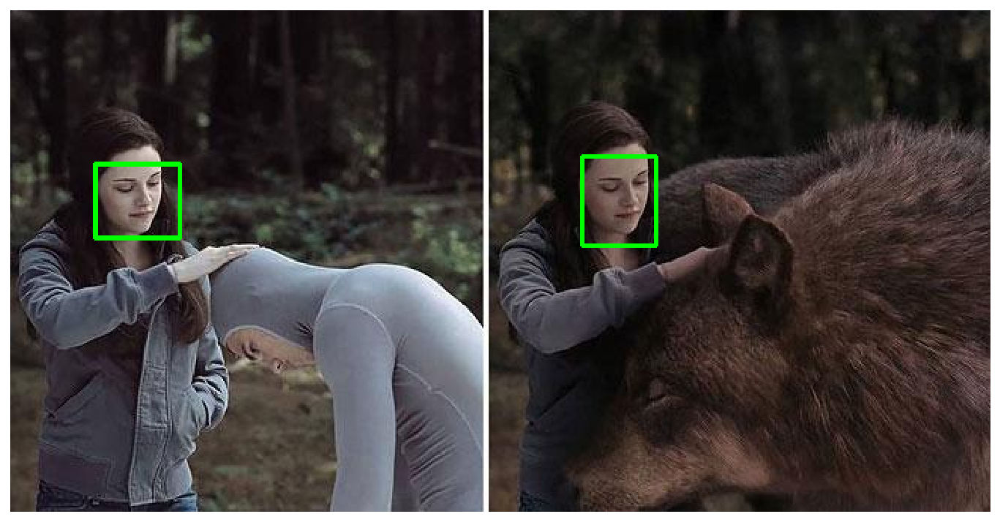

In [0]:
img_df = df[df.file_name == df.file_name.unique()[0]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

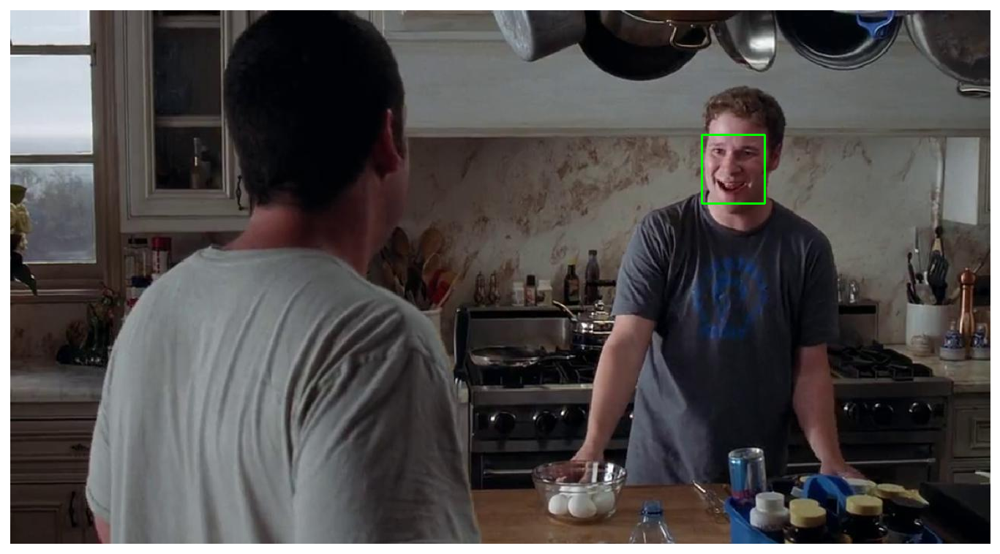

In [0]:
img_df = df[df.file_name == df.file_name.unique()[1]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

Those are good ones, the annotations are clearly visible. We can use torchvision to create a grid of images. Note that the images are in various sizes, so we'll resize them:

In [0]:
sample_images = [annotate_image(df[df.file_name == f]) for f in df.file_name.unique()[:10]]
sample_images = torch.as_tensor(sample_images)

In [0]:
sample_images.shape

torch.Size([10, 384, 384, 3])

In [0]:
sample_images = sample_images.permute(0, 3, 1, 2)

In [0]:
sample_images.shape

torch.Size([10, 3, 384, 384])

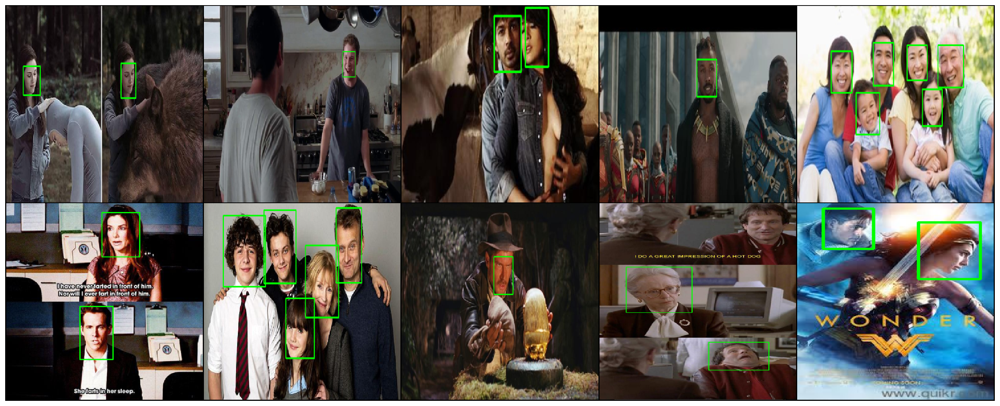

In [0]:
plt.figure(figsize=(24, 12))
grid_img = torchvision.utils.make_grid(sample_images, nrow=5)

plt.imshow(grid_img.permute(1, 2, 0))
plt.axis('off');

You can clearly see that some annotations are missing (column 4). That's real life data for you, sometimes you have to deal with it in some way.

## Face Detection with Detectron 2

It is time to go through the steps of fine-tuning a model using a custom dataset. But first, let's save 5% of the data for testing:

In [10]:
df = pd.read_csv('annotations.csv')

IMAGES_PATH = f'faces'

unique_files = df.file_name.unique()

train_files = np.random.choice(unique_files, int(len(unique_files) * 0.95), replace=False)
train_25 = np.random.choice(train_files, int(len(train_files) * 0.25), replace=False)
train_df = df[df.file_name.isin(train_25)]
test_df = df[~df.file_name.isin(train_files)]

train_df.shape

(248, 8)

The classical train_test_split won't work here, cause we want a split amongst the file names. 

The next parts are written in a bit more generic way. Obviously, we have a single class - face. But adding more should be as simple as adding more annotations to the dataframe:

In [0]:
classes = df.class_name.unique().tolist()

Next, we'll write a function that converts our dataset into a format that is used by Detectron2:

In [0]:
def create_dataset_dicts(df, classes):
  dataset_dicts = []
  for image_id, img_name in enumerate(df.file_name.unique()):

    record = {}

    image_df = df[df.file_name == img_name]

    file_path = f'{IMAGES_PATH}/{img_name}'
    record["file_name"] = file_path
    record["image_id"] = image_id
    record["height"] = int(image_df.iloc[0].height)
    record["width"] = int(image_df.iloc[0].width)

    objs = []
    for _, row in image_df.iterrows():

      xmin = int(row.x_min)
      ymin = int(row.y_min)
      xmax = int(row.x_max)
      ymax = int(row.y_max)

      poly = [
          (xmin, ymin), (xmax, ymin), 
          (xmax, ymax), (xmin, ymax)
      ]
      poly = list(itertools.chain.from_iterable(poly))

      obj = {
        "bbox": [xmin, ymin, xmax, ymax],
        "bbox_mode": BoxMode.XYXY_ABS,
        "segmentation": [poly],
        "category_id": classes.index(row.class_name),
        "iscrowd": 0
      }
      objs.append(obj)

    record["annotations"] = objs
    dataset_dicts.append(record)
  return dataset_dicts

We convert every annotation row to a single record with a list of annotations. You might also notice that we're building a polygon that is of the exact same shape as the bounding box. This is required for the image segmentation models in Detectron2.

You'll have to register your dataset into the dataset and metadata catalogues:

In [0]:
for d in ["train", "val"]:
  DatasetCatalog.register("faces_" + d, lambda d=d: create_dataset_dicts(train_df if d == "train" else test_df, classes))
  MetadataCatalog.get("faces_" + d).set(thing_classes=classes)

statement_metadata = MetadataCatalog.get("faces_train")

Unfortunately, evaluator for the test set is not included by default. We can easily fix that by writing our own trainer:

In [0]:
class CocoTrainer(DefaultTrainer):
  
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

The evaluation results will be stored in the `coco_eval` folder if no folder is provided.

Fine-tuning a Detectron2 model is nothing like writing PyTorch code. We'll load a configuration file, change a few values, and start the training process. But hey, it really helps if you know what you're doing 😂

For this tutorial, we'll use the Mask R-CNN X101-FPN model. It is pre-trained on the [COCO dataset](http://cocodataset.org/#home) and achieves very good performance. The downside is that it is slow to train.

Let's load the config file and the pre-trained model weights:

In [0]:
cfg = get_cfg()

cfg.merge_from_file(
  model_zoo.get_config_file(
    "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
  )
)

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
  "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
)

Specify the datasets (we registered those) we'll use for training and evaluation:

In [0]:
cfg.DATASETS.TRAIN = ("faces_train",)
cfg.DATASETS.TEST = ("faces_val",)
cfg.DATALOADER.NUM_WORKERS = 4

And for the optimizer, we'll do a bit of magic to converge to something nice:

In [0]:
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05

Except for the standard stuff (batch size, max number of iterations, and learning rate) we have a couple of interesting params:

- `WARMUP_ITERS` - the learning rate starts from 0 and goes to the preset one for this number of iterations
- `STEPS` - the checkpoints (number of iterations) at which the learning rate will be reduced by `GAMMA`

Finally, we'll specify the number of classes and the period at which we'll evaluate on the test set:

In [0]:
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)

cfg.TEST.EVAL_PERIOD = 500

Time to train, using our custom trainer:

In [19]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/09 21:59:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:36, 11.8MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


[04/09 22:00:03 d2.engine.train_loop]: Starting training from iteration 0
[04/09 22:00:39 d2.utils.events]:  eta: 0:45:13  iter: 19  total_loss: 1.826  loss_cls: 0.551  loss_box_reg: 0.345  loss_mask: 0.685  loss_rpn_cls: 0.136  loss_rpn_loc: 0.023  time: 1.8295  data_time: 0.0367  lr: 0.000020  max_mem: 11278M
[04/09 22:01:16 d2.utils.events]:  eta: 0:44:40  iter: 39  total_loss: 1.667  loss_cls: 0.480  loss_box_reg: 0.287  loss_mask: 0.621  loss_rpn_cls: 0.155  loss_rpn_loc: 0.023  time: 1.8368  data_time: 0.0104  lr: 0.000040  max_mem: 11279M
[04/09 22:01:53 d2.utils.events]:  eta: 0:44:01  iter: 59  total_loss: 1.818  loss_cls: 0.472  loss_box_reg: 0.654  loss_mask: 0.538  loss_rpn_cls: 0.105  loss_rpn_loc: 0.021  time: 1.8338  data_time: 0.0113  lr: 0.000060  max_mem: 11279M
[04/09 22:02:30 d2.utils.events]:  eta: 0:43:29  iter: 79  total_loss: 1.738  loss_cls: 0.450  loss_box_reg: 0.725  loss_mask: 0.492  loss_rpn_cls: 0.055  loss_rpn_loc: 0.020  time: 1.8415  data_time: 0.0146  

## Evaluating Object Detection Models

Evaluating object detection models is a bit different when compared to evaluating standard classification or regression models.

The main metric you need to know about is IoU (intersection over union). It measures the overlap between two boundaries - the predicted and ground truth one. It can get values between 0 and 1.

$$\text{IoU}=\frac{\text{area of overlap}}{\text{area of union}}$$

Using IoU, one can define a threshold (e.g. >0.5) to classify whether a prediction is a true positive (TP) or a false positive (FP).

Now you can calculate average precision (AP) by taking the area under the precision-recall curve.

Now AP@X (e.g. AP50) is just AP at some IoU threshold. This should give you a working understanding of how object detection models are evaluated.

I suggest you read the [mAP (mean Average Precision) for Object Detection](https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173) tutorial by Jonathan Hui if you want to learn more on the topic.

In [0]:
%load_ext tensorboard

In [23]:
%tensorboard --logdir output

<IPython.core.display.Javascript object>

I've prepared a pre-trained model for you, so you don't have to wait for the training to complete. Let's download it:

In [0]:
'''!gdown --id 18Ev2bpdKsBaDufhVKf0cT6RmM3FjW3nL
!mv face_detector.pth output/model_final.pth'''

We can start making predictions by loading the model and setting a minimum threshold of 85% certainty at which we'll consider the predictions as correct:

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

Let's run the evaluator with the trained model:

In [25]:
evaluator = COCOEvaluator("faces_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "faces_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

[04/09 22:53:40 d2.data.common]: Serializing 21 elements to byte tensors and concatenating them all ...
[04/09 22:53:40 d2.data.common]: Serialized dataset takes 0.01 MiB
[04/09 22:53:40 d2.evaluation.evaluator]: Start inference on 21 images
[04/09 22:53:43 d2.evaluation.evaluator]: Inference done 11/21. 0.2007 s / img. ETA=0:00:02
[04/09 22:53:45 d2.evaluation.evaluator]: Total inference time: 0:00:03.608307 (0.225519 s / img per device, on 1 devices)
[04/09 22:53:45 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:03 (0.200936 s / img per device, on 1 devices)
[04/09 22:53:45 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/09 22:53:45 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/09 22:53:45 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE 

OrderedDict([('bbox',
              {'AP': 15.872196874641132,
               'AP50': 42.18945323416141,
               'AP75': 9.045427538056144,
               'APl': 21.304669418348485,
               'APm': 11.836538419633289,
               'APs': 1.5594059405940595}),
             ('segm',
              {'AP': 14.762213143733764,
               'AP50': 41.24320295608792,
               'AP75': 10.565879441999716,
               'APl': 20.626819009997458,
               'APm': 10.500627536955665,
               'APs': 1.2995049504950495})])

### Finding Faces in Images

Next, let's create a folder and save all images with predicted annotations in the test set:

In [0]:
os.makedirs("annotated_results", exist_ok=True)

test_image_paths = test_df.file_name.unique()

In [0]:
for clothing_image in test_image_paths:
  file_path = f'{IMAGES_PATH}/{clothing_image}'
  im = cv2.imread(file_path)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'annotated_results/{file_name}', result)

Let's have a look:

In [0]:
annotated_images = [f'annotated_results/{f}' for f in test_df.file_name.unique()]

In [35]:
for obj in annotated_images:
  print(obj)

annotated_results/face_20.jpeg
annotated_results/face_71.jpeg
annotated_results/face_87.jpeg
annotated_results/face_99.jpeg
annotated_results/face_102.jpeg
annotated_results/face_106.jpeg
annotated_results/face_121.jpeg
annotated_results/face_130.jpeg
annotated_results/face_149.jpeg
annotated_results/face_151.jpeg
annotated_results/face_188.jpeg
annotated_results/face_214.jpeg
annotated_results/face_257.jpeg
annotated_results/face_270.jpeg
annotated_results/face_308.jpeg
annotated_results/face_330.jpeg
annotated_results/face_343.jpeg
annotated_results/face_348.jpeg
annotated_results/face_359.jpeg
annotated_results/face_372.jpeg
annotated_results/face_408.jpeg


In [36]:
annotated_images[18]

'annotated_results/face_359.jpeg'

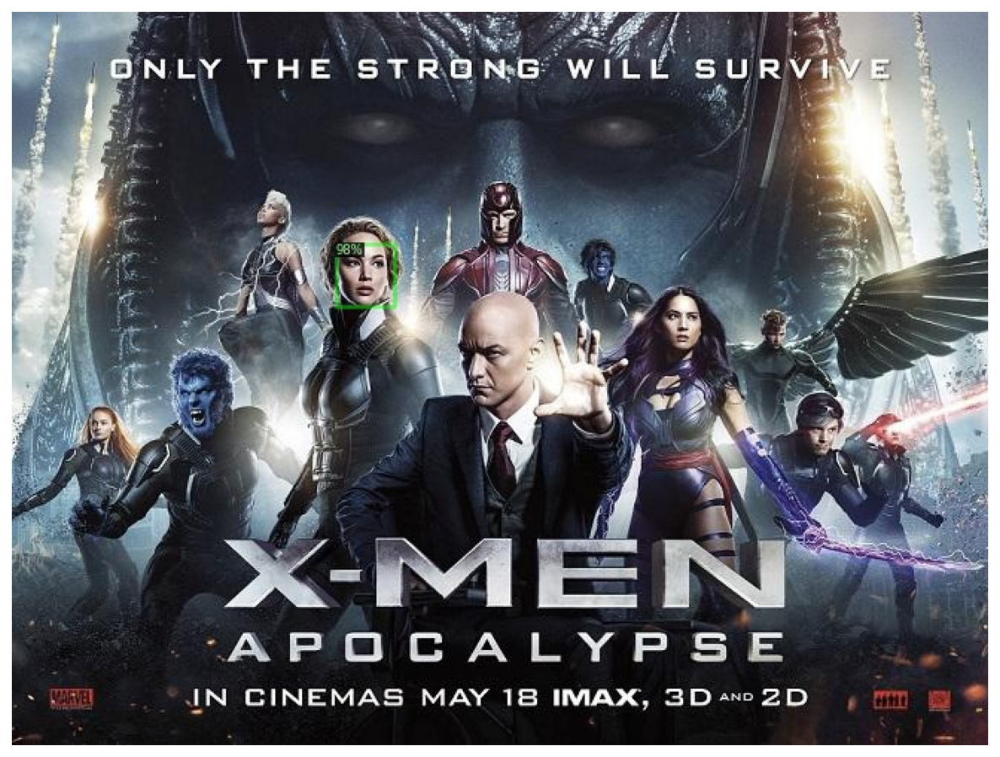

In [44]:
img = cv2.cvtColor(cv2.imread(annotated_images[20]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

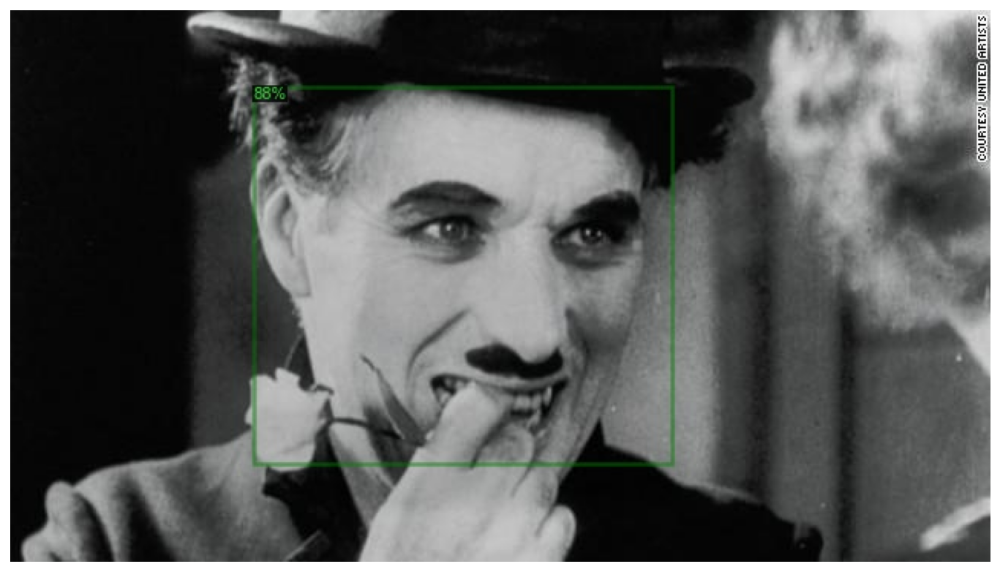

In [49]:
img = cv2.cvtColor(cv2.imread(annotated_images[4]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

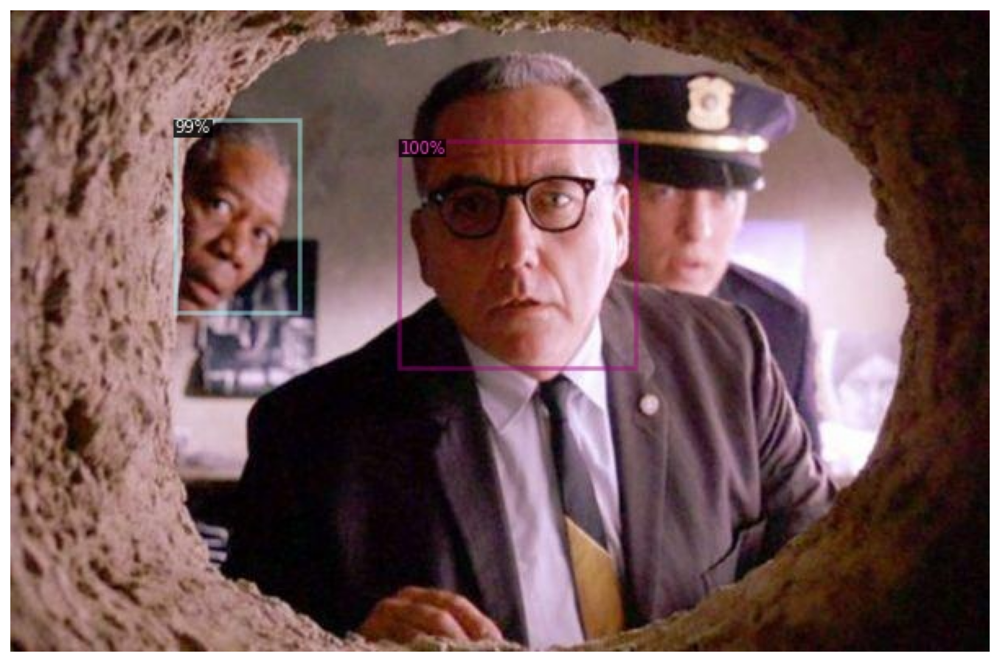

In [0]:
img = cv2.cvtColor(cv2.imread(annotated_images[3]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

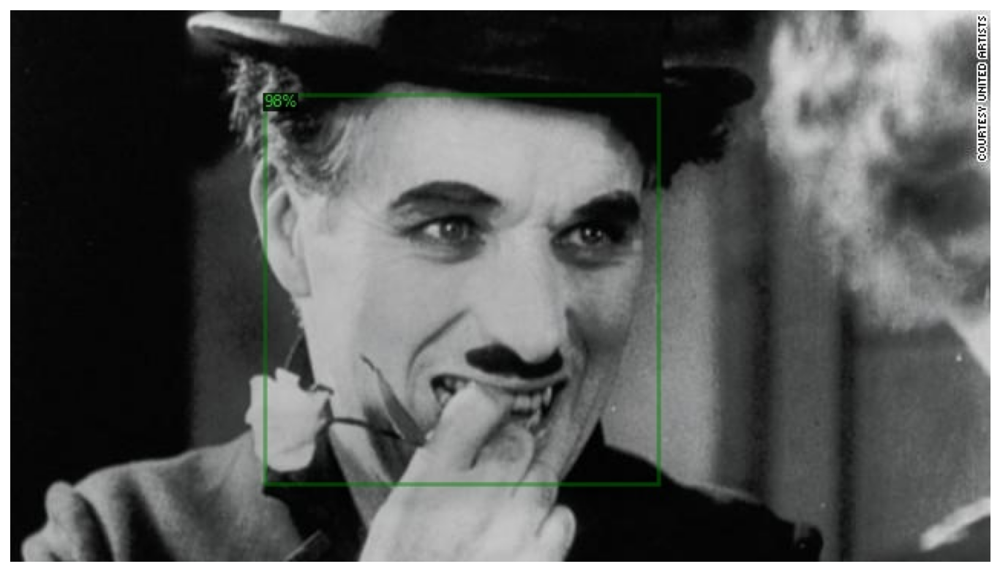

In [0]:
img = cv2.cvtColor(cv2.imread(annotated_images[4]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

Not bad. Not bad at all. I suggest you explore more images on your own, too!

Note that some faces have multiple bounding boxes (on the second image) with different degrees of certainty. Maybe training the model longer will help? How about adding more or augmenting the existing data?

## References

- [Face Detection in Images](https://www.kaggle.com/dataturks/face-detection-in-images)
- [Detectron2 on GitHub](https://github.com/facebookresearch/detectron2/)
- [mAP (mean Average Precision) for Object Detection](https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173)